<a href="https://colab.research.google.com/github/SakuniNK/Research-Project/blob/main/FinalTopicModellingFrontend.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%env PYTHONWARNINGS=ignore::DeprecationWarning
import warnings, logging
warnings.filterwarnings("ignore", category=DeprecationWarning)
logging.getLogger("py.warnings").setLevel(logging.ERROR)


env: PYTHONWARNINGS=ignore::DeprecationWarning


In [ ]:
!pip install --upgrade pip setuptools wheel
!pip install flask flask-cors pyngrok gensim==4.3.2 scipy==1.13.1 numpy==1.26.4 nltk spacy pyldavis wordcloud


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 25.2 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 75.2.0
    Uninstalling setuptools-75.2.0:
      Successfully uninstalled setuptools-75.2.0
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.3/23.3 MB 86.8 MB/s  0:00:00
  Installing build dependencies ... canceled
ERROR: Operation cancelled by user
^C


In [ ]:
!pip uninstall -y scipy gensim
!pip install scipy==1.10.1 gensim==4.3.2

Found existing installation: scipy 1.16.2
Uninstalling scipy-1.16.2:
  Successfully uninstalled scipy-1.16.2
ERROR: Ignored the following yanked versions: 1.11.0, 1.14.0rc1
ERROR: Ignored the following versions that require a different python version: 1.10.0 Requires-Python >=3.8,<3.12; 1.10.0rc1 Requires-Python >=3.8,<3.12; 1.10.0rc2 Requires-Python >=3.8,<3.12; 1.10.1 Requires-Python >=3.8,<3.12; 1.6.2 Requires-Python >=3.7,<3.10; 1.6.3 Requires-Python >=3.7,<3.10; 1.7.0 Requires-Python >=3.7,<3.10; 1.7.1 Requires-Python >=3.7,<3.10; 1.7.2 Requires-Python >=3.7,<3.11; 1.7.3 Requires-Python >=3.7,<3.11; 1.8.0 Requires-Python >=3.8,<3.11; 1.8.0rc1 Requires-Python >=3.8,<3.11; 1.8.0rc2 Requires-Python >=3.8,<3.11; 1.8.0rc3 Requires-Python >=3.8,<3.11; 1.8.0rc4 Requires-Python >=3.8,<3.11; 1.8.1 Requires-Python >=3.8,<3.11; 1.9.0 Requires-Python >=3.8,<3.12; 1.9.0rc1 Requires-Python >=3.8,<3.12; 1.9.0rc2 Requires-Python >=3.8,<3.12; 1.9.0rc3 Requires-Python >=3.8,<3.12; 1.9.1 Requires-Py

In [ ]:
!pip install pyldavis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 51.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.6/26.6 MB 135.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 125.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.2/38.2 MB 51.6 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [pyldavis]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
tsfresh 0.21.1 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >=

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
import json
import glob
import re
import numpy as np
import pandas as pd
from collections import defaultdict
import spacy
import gensim
import gensim.corpora as corpora
from gensim.models import LdaModel, TfidfModel, Phrases
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import stopwords
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt


print(f"Gensim version: {gensim.__version__}")
print(f"SciPy version: {np.__version__}")


nltk.download('stopwords')
spacy.cli.download("en_core_web_sm")
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

Mounted at /content/drive
Gensim version: 4.3.3
SciPy version: 1.26.4


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.d

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
%env PYTHONWARNINGS=ignore::DeprecationWarning
import warnings, logging
warnings.filterwarnings("ignore", category=DeprecationWarning)
logging.getLogger("py.warnings").setLevel(logging.ERROR)


env: PYTHONWARNINGS=ignore::DeprecationWarning


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

import os
import json
import glob
import re
import numpy as np
import pandas as pd
from collections import defaultdict
import spacy
import gensim
import gensim.corpora as corpora
from gensim.models import LdaModel, TfidfModel, Phrases
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import stopwords
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt


print(f"Gensim version: {gensim.__version__}")
print(f"SciPy version: {np.__version__}")


nltk.download('stopwords')
spacy.cli.download("en_core_web_sm")
nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])

# Load and Preprocess Data (corrected)
def load_data(directory):
    data = []
    years = []
    file_paths = glob.glob(os.path.join(directory, "*.json"))

    for file_path in file_paths:
        try:
            with open(file_path, 'r', encoding='utf-8') as f:
                doc = json.load(f)
                text = ""
                # Combine sections
                for section in ["conclusion", "limitation", "future_work"]:
                    if section in doc and doc[section].strip():
                        text += doc[section] + " "
                year = doc.get("published_year", None)

                if text.strip():  # Skip empty docs
                    data.append(text.strip())
                    years.append(year)
        except Exception as e:
            print(f"Error processing {file_path}: {str(e)}")
            continue

    return data, years


directory_path = "/content/drive/My Drive/DsOutput"
data, years = load_data(directory_path)
print(f"Loaded {len(data)} documents")
print(f"Sample year values: {set(years[:10])}")


print("\nSample document:")
print(data[0][:200] + "...")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Gensim version: 4.3.3
SciPy version: 1.26.4


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: da

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

Loaded 423 documents
Sample year values: {2024, 2021}

Sample document:
Thinking of future generations may be an of-course-we-do-that idea, but most of
the people’s approach in this matter is limited to concerns about the future size of the
population in some places or co...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

In [ ]:
# --- Suppress all warnings at source ---
%env PYTHONWARNINGS=ignore

import warnings, logging
warnings.filterwarnings("ignore")
logging.getLogger("py.warnings").setLevel(logging.ERROR)


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

env: PYTHONWARNINGS=ignore


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
import re
import spacy
import nltk
from gensim.utils import simple_preprocess
from gensim.models.phrases import Phrases, Phraser
from gensim import corpora
from gensim.models import TfidfModel, LdaModel
from nltk.corpus import stopwords
from collections import defaultdict, Counter
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Download required NLTK data
nltk.download('stopwords')
nltk.download('wordnet')

# Load spaCy model
try:
    nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])
except OSError:
    print("Downloading spaCy English model...")
    from spacy.cli import download
    download("en_core_web_sm")
    nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])

# Enhanced custom stopwords
stop_words = set(stopwords.words('english'))
custom_stopwords = {
    # Generic academic terms
    "study", "studies", "research", "paper", "work", "project",
    "result", "results", "finding", "findings", "analysis",
    "method", "methods", "methodology", "approach", "model",
    "framework", "system", "process", "data", "information",
    "based", "using", "use", "used", "show", "shows", "shown",
    "propose", "proposed", "present", "presents", "provide",
    "provides", "demonstrate", "demonstrates", "investigate",
    "investigates", "examine", "examines", "discuss", "discusses",
    "important", "significant", "various", "different", "several",
    "multiple", "many", "also", "however", "therefore", "thus",
    "moreover", "furthermore", "additionally", "conclusion",
    "limitation", "future", "work", "section", "chapter",
    "article", "journal", "conference", "proceedings"
}
stop_words.update(custom_stopwords)

def enhanced_preprocess(texts):
    """Enhanced preprocessing with better filtering"""
    processed_texts = []
    for text in texts:
        # More aggressive cleaning
        text = re.sub(r'[^a-zA-Z\s]', '', text.lower())
        text = re.sub(r'\b\w{1,2}\b', '', text)  # Remove 1-2 letter words
        text = re.sub(r'\s+', ' ', text).strip()  # Normalize whitespace

        # Tokenize with more filtering
        tokens = [
            word for word in simple_preprocess(text, deacc=True, min_len=3, max_len=50)
            if word not in stop_words and len(word) > 3
        ]
        processed_texts.append(tokens)
    return processed_texts

def enhanced_lemmatize(texts):
    """Enhanced lemmatization with POS filtering"""
    lemmatized = []
    meaningful_pos = {'NOUN', 'VERB', 'ADJ', 'ADV'}  # Only keep these POS

    for tokens in texts:
        if not tokens:  # Skip empty documents
            lemmatized.append([])
            continue

        doc = nlp(" ".join(tokens))
        lemmas = []
        for token in doc:
            # Only keep meaningful POS tags and lemmas that are not stopwords
            if (token.pos_ in meaningful_pos and
                token.lemma_ not in stop_words and
                len(token.lemma_) > 3):
                lemmas.append(token.lemma_)
        lemmatized.append(lemmas)
    return lemmatized

def create_quality_ngrams(texts):
    """Create high-quality n-grams using proper thresholds"""
    # Use reasonable thresholds for better quality
    bigram = Phrases(texts, min_count=10, threshold=15.0)
    trigram = Phrases(bigram[texts], threshold=10.0)

    bigram_phraser = Phraser(bigram)
    trigram_phraser = Phraser(trigram)

    # Apply n-grams
    ngram_texts = [trigram_phraser[bigram_phraser[doc]] for doc in texts]

    # Enhanced filtering for meaningful terms
    quality_ngrams = []
    meaningless_suffixes = {'ing', 'ed', 'ly', 'ment', 'tion', 'sion'}

    for doc in ngram_texts:
        filtered_doc = []
        for phrase in doc:
            words = phrase.split('_')

            # Quality checks for n-grams
            if len(words) > 1:
                # N-gram: check if it represents a coherent concept
                if all(3 <= len(word) <= 20 and word not in stop_words for word in words):
                    # Avoid n-grams with meaningless patterns
                    if not any(phrase.endswith(suffix) for suffix in meaningless_suffixes):
                        filtered_doc.append(phrase)
            else:
                # Single word quality checks
                word = phrase
                if (4 <= len(word) <= 25 and
                    word not in stop_words and
                    not word.isnumeric() and
                    not any(char.isdigit() for char in word) and
                    not any(word.endswith(suffix) for suffix in meaningless_suffixes)):
                    filtered_doc.append(word)

        quality_ngrams.append(filtered_doc)

    return quality_ngrams

# Apply enhanced preprocessing
print("=== ENHANCED PREPROCESSING ===")
processed_data = enhanced_preprocess(data)
print(f"✓ Basic preprocessing completed: {len(processed_data)} documents")

lemmatized_data = enhanced_lemmatize(processed_data)
print(f"✓ Enhanced lemmatization completed: {len(lemmatized_data)} documents")

ngram_data = create_quality_ngrams(lemmatized_data)
print(f"✓ Quality n-grams created: {len(ngram_data)} documents")

# Check vocabulary quality
all_words = [word for doc in ngram_data for word in doc]
vocab = Counter(all_words)
print(f"✓ Vocabulary size: {len(vocab)}")
print(f"Top 20 meaningful words: {vocab.most_common(20)}")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


=== ENHANCED PREPROCESSING ===
✓ Basic preprocessing completed: 423 documents
✓ Enhanced lemmatization completed: 423 documents
✓ Quality n-grams created: 423 documents
✓ Vocabulary size: 36767
Top 20 meaningful words: [('finance', 3977), ('financial', 2824), ('policy', 2384), ('evidence', 1765), ('economic', 1761), ('energy', 1749), ('impact', 1743), ('firm', 1681), ('market', 1620), ('effect', 1509), ('access', 1382), ('country', 1304), ('risk', 1257), ('corporate', 1156), ('green', 1114), ('performance', 1100), ('health', 1099), ('cost', 1074), ('case', 1043), ('global', 1002)]


In [ ]:
def enhanced_filter_tfidf(ngram_data, min_tfidf=0.035, max_doc_freq=0.5):
    """Enhanced TF-IDF filtering with document frequency limits"""
    # Create dictionary with more filtering
    id2word = corpora.Dictionary(ngram_data)

    # Filter extreme values more aggressively
    id2word.filter_extremes(no_below=5, no_above=max_doc_freq, keep_n=100000)

    corpus = [id2word.doc2bow(text) for text in ngram_data]

    # Calculate document frequency for additional filtering
    doc_freq = defaultdict(int)
    for doc in ngram_data:
        unique_words = set(doc)
        for word in unique_words:
            if word in id2word.token2id:
                doc_freq[word] += 1

    # Enhanced TF-IDF filtering
    tfidf = TfidfModel(corpus)
    filtered_corpus = []
    empty_docs = 0

    for i, bow in enumerate(corpus):
        tfidf_weights = {id: value for id, value in tfidf[bow]}
        filtered_bow = []

        for id, count in bow:
            word = id2word[id]
            tfidf_value = tfidf_weights.get(id, 0)

            # Enhanced filtering criteria
            if (tfidf_value >= min_tfidf and
                doc_freq.get(word, 0) < len(ngram_data) * 0.4):  # Appears in <40% of docs
                filtered_bow.append((id, count))

        if not filtered_bow:
            empty_docs += 1
        filtered_corpus.append(filtered_bow)

    print(f"✓ Enhanced filtering completed")
    print(f"  Non-empty documents: {len(filtered_corpus) - empty_docs}")
    print(f"  Dictionary size: {len(id2word)}")

    return filtered_corpus, id2word

print("\n=== TF-IDF FILTERING ===")
filtered_corpus, id2word = enhanced_filter_tfidf(ngram_data, min_tfidf=0.04, max_doc_freq=0.5)


=== TF-IDF FILTERING ===
✓ Enhanced filtering completed
  Non-empty documents: 423
  Dictionary size: 5312


In [ ]:
print("\n=== LDA MODEL TRAINING ===")
num_topics = 50
lda_model = LdaModel(
    corpus=filtered_corpus,
    id2word=id2word,
    num_topics=num_topics,
    random_state=100,
    passes=15,
    alpha='asymmetric',
    eta='auto',
    iterations=100,
    eval_every=5
)

print("✓ LDA model trained successfully!")
print(f"✓ Number of topics: {lda_model.num_topics}")

# Save model
lda_model.save("lda_model_enhanced.gensim")
print("✓ Model saved as 'lda_model_enhanced.gensim'")


=== LDA MODEL TRAINING ===
✓ LDA model trained successfully!
✓ Number of topics: 50
✓ Model saved as 'lda_model_enhanced.gensim'


In [ ]:
def get_enhanced_distinct_topics(lda_model, min_exclusivity=0.8, topn=8, min_word_length=4):
    """
    Extract distinct topics with enhanced meaningful keyword filtering
    """
    num_topics = lda_model.num_topics
    word_topic_matrix = defaultdict(dict)

    # Build word-topic matrix
    for topic_id in range(num_topics):
        for word, prob in lda_model.show_topic(topic_id, topn=None):
            word_topic_matrix[word][topic_id] = prob

    # Enhanced distinct topics extraction
    enhanced_distinct_topics = {}

    for topic_id in range(num_topics):
        candidate_words = []

        # Consider more words to ensure quality selection
        for word, prob in lda_model.show_topic(topic_id, topn=topn*5):
            # Skip if word is too short
            if len(word) < min_word_length:
                continue

            # Skip if word contains numbers or special characters
            if any(char.isdigit() for char in word):
                continue

            # Skip words with meaningless suffixes
            meaningless_suffixes = {'ing', 'ed', 'ly', 'ment', 'tion', 'sion'}
            if any(word.endswith(suffix) for suffix in meaningless_suffixes) and len(word) <= 6:
                continue

            topic_probs = word_topic_matrix[word]
            sorted_probs = sorted(topic_probs.values(), reverse=True)

            if len(sorted_probs) > 1:
                exclusivity = sorted_probs[0] / sorted_probs[1]
                if exclusivity >= min_exclusivity and max(topic_probs, key=topic_probs.get) == topic_id:
                    candidate_words.append((word, prob, exclusivity))
            else:
                # Word only appears in one topic
                candidate_words.append((word, prob, 10.0))

        # Sort by combined score (probability * exclusivity * word_length_bonus)
        candidate_words.sort(key=lambda x: x[1] * (1 + x[2]) * (1 + len(x[0])/20), reverse=True)

        # Remove semantically redundant words
        final_keywords = []
        for word, prob, exclusivity in candidate_words:
            # Check for redundancy with existing words
            is_redundant = False
            for existing_word in final_keywords:  # FIXED: no unpacking needed
                # Avoid words that are too similar
                if (word in existing_word or existing_word in word) and len(word) > 4 and len(existing_word) > 4:
                    is_redundant = True
                    break
                # Avoid words that share same root (simple check)
                if len(word) > 5 and len(existing_word) > 5 and word[:4] == existing_word[:4]:
                    is_redundant = True
                    break

            if not is_redundant:
                final_keywords.append(word)  # FIXED: only store the word, not the tuple

            if len(final_keywords) >= topn:
                break

        enhanced_distinct_topics[topic_id] = final_keywords

    return enhanced_distinct_topics

print("\n=== ENHANCED DISTINCT TOPICS EXTRACTION ===")
enhanced_distinct_topics = get_enhanced_distinct_topics(
    lda_model,
    min_exclusivity=0.85,
    topn=8,
    min_word_length=4
)

print("✓ Enhanced distinct topics extracted successfully!")
print("\nEnhanced Distinct Topics (showing topics with distinct keywords):")
distinct_topic_count = 0
for topic_id, keywords in enhanced_distinct_topics.items():
    if keywords:
        distinct_topic_count += 1
        print(f"Topic {topic_id}: {', '.join(keywords)}")

print(f"\n✓ {distinct_topic_count}/{lda_model.num_topics} topics have distinct keywords")


=== ENHANCED DISTINCT TOPICS EXTRACTION ===
✓ Enhanced distinct topics extracted successfully!

Enhanced Distinct Topics (showing topics with distinct keywords):
Topic 0: financial_literacy, nuclear, prog, sustainable_finance, retailer, replicate, image, design
Topic 1: total_cost, device, member, covid_pandemic, cancer, nancing_constraint, stable, decrease
Topic 2: leakage, leadership, digital_finance, industrial_structure_upgrade, biomass, income, intelligent, educ
Topic 3: union, labor_market, indicator_variable_equal, total_asset, wage, follow, accounting_review, interest
Topic 4: carbon_neutrality, startup, seem, environmental_awareness, exit, teacher, density, county
Topic 5: private_enterprise, costeffectiveness, estimate, decision_tree, benefit, quintile, essential, mortality
Topic 6: newspaper, sustainable, know, respondent, answer, flow, livestock, word
Topic 7: institute, expense, open_innov_technol_mark, scientific, cluster, money_launder, productive, activity
Topic 8: tra

In [ ]:
def get_enhanced_distinct_topics(lda_model, min_exclusivity=0.8, topn=8, min_word_length=4):
    """
    Extract distinct topics with enhanced meaningful keyword filtering
    """
    from collections import defaultdict

    num_topics = lda_model.num_topics
    word_topic_matrix = defaultdict(dict)

    # Build word-topic matrix
    for topic_id in range(num_topics):
        for word, prob in lda_model.show_topic(topic_id, topn=None):
            word_topic_matrix[word][topic_id] = prob

    # Enhanced distinct topics extraction
    enhanced_distinct_topics = {}

    for topic_id in range(num_topics):
        candidate_words = []

        # Consider more words to ensure quality selection
        for word, prob in lda_model.show_topic(topic_id, topn=topn*5):
            # Skip if word is too short
            if len(word) < min_word_length:
                continue

            # Skip if word contains numbers
            if any(char.isdigit() for char in word):
                continue

            topic_probs = word_topic_matrix[word]
            sorted_probs = sorted(topic_probs.values(), reverse=True)

            if len(sorted_probs) > 1:
                exclusivity = sorted_probs[0] / sorted_probs[1]
                if exclusivity >= min_exclusivity and max(topic_probs, key=topic_probs.get) == topic_id:
                    candidate_words.append((word, prob, exclusivity))
            else:
                # Word only appears in one topic
                candidate_words.append((word, prob, 10.0))

        # Sort by combined score
        candidate_words.sort(key=lambda x: x[1] * (1 + x[2]), reverse=True)

        # Remove redundant words
        final_keywords = []
        for word, prob, exclusivity in candidate_words:
            # Check for redundancy
            is_redundant = False
            for existing_word in final_keywords:
                if (word in existing_word or existing_word in word) and len(word) > 4:
                    is_redundant = True
                    break

            if not is_redundant:
                final_keywords.append(word)

            if len(final_keywords) >= topn:
                break

        enhanced_distinct_topics[topic_id] = final_keywords

    return enhanced_distinct_topics

print("\n=== ENHANCED DISTINCT TOPICS EXTRACTION ===")
enhanced_distinct_topics = get_enhanced_distinct_topics(
    lda_model,
    min_exclusivity=0.85,
    topn=8,
    min_word_length=4
)

print("✓ Enhanced distinct topics extracted successfully!")

# Display results
distinct_topic_count = sum(1 for keywords in enhanced_distinct_topics.values() if keywords)
print(f"\n✓ {distinct_topic_count}/{lda_model.num_topics} topics have distinct keywords")

print("\nEnhanced Distinct Topics:")
for topic_id in range(lda_model.num_topics):
    keywords = enhanced_distinct_topics.get(topic_id, [])
    if keywords:
        print(f"Topic {topic_id}: {', '.join(keywords)}")


=== ENHANCED DISTINCT TOPICS EXTRACTION ===
✓ Enhanced distinct topics extracted successfully!

✓ 50/50 topics have distinct keywords

Enhanced Distinct Topics:
Topic 0: financial_literacy, prog, nuclear, retailer, replicate, image, sustainable_finance, design
Topic 1: total_cost, device, member, covid, cancer, stable, decrease, nancing_constraint
Topic 2: leakage, leadership, digital_finance, biomass, income, industrial_structure_upgrade, educ, intelligent
Topic 3: union, labor_market, total_asset, wage, follow, indicator_variable_equal, interest, accounting_review
Topic 4: carbon_neutrality, startup, seem, environmental_awareness, exit, environ_manage, teacher, density
Topic 5: private_enterprise, estimate, costeffectiveness, benefit, quintile, essential, decision_tree, mortality
Topic 6: newspaper, know, sustainable, respondent, answer, flow, livestock, word
Topic 7: institute, expense, scientific, cluster, open_innov_technol_mark, activity, productive, money_launder
Topic 8: trans

In [ ]:
# @title
# Custom stopwords
stop_words = set(stopwords.words('english'))
custom_stopwords = {"study", "result", "paper", "research", "model", "based", "show", "use"}
stop_words.update(custom_stopwords)

def preprocess(texts):
    processed_texts = []
    for text in texts:
        # Lowercase and remove special chars/numbers
        text = re.sub(r'[^a-zA-Z\s]', '', text.lower())
        # Tokenize and remove stopwords
        tokens = [word for word in simple_preprocess(text)
                 if word not in stop_words and len(word) > 2]
        processed_texts.append(tokens)
    return processed_texts

# Lemmatization
def lemmatize(texts):
    lemmatized = []
    for tokens in texts:
        doc = nlp(" ".join(tokens))
        lemmatized.append([token.lemma_ for token in doc])
    return lemmatized

# Create n-grams
def create_ngrams(texts):
    bigram = Phrases(texts, min_count=5, threshold=100)
    trigram = Phrases(bigram[texts], threshold=100)
    bigram_phraser = gensim.models.phrases.Phraser(bigram)
    trigram_phraser = gensim.models.phrases.Phraser(trigram)
    return [trigram_phraser[bigram_phraser[doc]] for doc in texts]

# Apply preprocessing
processed_data = preprocess(data)
print("Basic preprocessing completed")
lemmatized_data = lemmatize(processed_data)
print("Lemmatization completed")
ngram_data = create_ngrams(lemmatized_data)
print("N-grams created")

Basic preprocessing completed
Lemmatization completed
N-grams created


In [ ]:
# @title
-
%env PYTHONWARNINGS=ignore

import warnings, logging
warnings.filterwarnings("ignore")
logging.getLogger("py.warnings").setLevel(logging.ERROR)

SyntaxError: invalid syntax (ipython-input-1021823534.py, line 1)

In [ ]:
# @title
def filter_tfidf(ngram_data):
    id2word = corpora.Dictionary(ngram_data)
    corpus = [id2word.doc2bow(text) for text in ngram_data]

    tfidf = TfidfModel(corpus)
    filtered_corpus = []
    low_value_threshold = 0.03

    for i, bow in enumerate(corpus):
        tfidf_weights = {id: value for id, value in tfidf[bow]}
        filtered_bow = [
            (id, count) for id, count in bow
            if tfidf_weights.get(id, 0) >= low_value_threshold
        ]
        filtered_corpus.append(filtered_bow)

    return filtered_corpus, id2word

filtered_corpus, id2word = filter_tfidf(ngram_data)
print(f"Filtered corpus size: {len(filtered_corpus)}")
print(f"Dictionary size: {len(id2word)}")

Filtered corpus size: 423
Dictionary size: 63085


In [ ]:
# @title
from gensim import corpora
from gensim.models import TfidfModel
import numpy as np

def enhanced_filter_tfidf(ngram_data, min_tfidf=0.035):
    """
    Enhanced TF-IDF filtering that also tracks term exclusivity
    """
    # Create dictionary and corpus
    id2word = corpora.Dictionary(ngram_data)
    corpus = [id2word.doc2bow(text) for text in ngram_data]

    # Calculate TF-IDF
    tfidf = TfidfModel(corpus)

    # Calculate document frequency
    doc_freq = defaultdict(int)
    for doc in ngram_data:
        unique_words = set(doc)
        for word in unique_words:
            if word in id2word.token2id:
                doc_freq[word] += 1

    # Filter corpus and track term exclusivity
    filtered_corpus = []
    term_exclusivity = defaultdict(list)

    for i, bow in enumerate(corpus):
        tfidf_weights = {id: value for id, value in tfidf[bow]}
        filtered_bow = []

        for id, count in bow:
            word = id2word[id]
            tfidf_value = tfidf_weights.get(id, 0)

            # Enhanced filtering: TF-IDF + document frequency
            if tfidf_value >= min_tfidf and doc_freq.get(word, 0) < len(ngram_data)*0.3:
                filtered_bow.append((id, count))
                # Track term for exclusivity analysis
                term_exclusivity[word].append(i)

        filtered_corpus.append(filtered_bow)

    # Calculate term exclusivity scores
    for word, docs in term_exclusivity.items():
        # Exclusivity = 1 / (number of documents containing the word)
        term_exclusivity[word] = 1 / len(docs) if docs else 0

    return filtered_corpus, id2word, term_exclusivity

# Apply enhanced filtering
filtered_corpus, id2word, term_exclusivity = enhanced_filter_tfidf(ngram_data, min_tfidf=0.04)

# Train LDA with enhanced filtering
lda_model = LdaModel(
    corpus=filtered_corpus,
    id2word=id2word,
    num_topics=60,
    random_state=100,
    passes=15,      # better convergence
    alpha='asymmetric',  # topic separation
    eta='auto'
)

In [ ]:
from gensim.models import CoherenceModel

def evaluate_model(model, texts, dictionary):
    """Evaluate model coherence"""
    try:
        coherence_model = CoherenceModel(
            model=model,
            texts=texts,
            dictionary=dictionary,
            coherence='c_v'
        )
        return coherence_model.get_coherence()
    except Exception as e:
        print(f"Coherence calculation failed: {e}")
        return None

print("\n=== MODEL EVALUATION ===")
coherence_score = evaluate_model(lda_model, ngram_data, id2word)

if coherence_score is not None:
    print(f"✓ Coherence Score (C_v): {coherence_score:.4f}")

    # Interpretation
    if coherence_score > 0.6:
        print("  Excellent topic coherence (≥0.6)")
    elif coherence_score > 0.5:
        print("  Good topic coherence (0.5-0.6)")
    elif coherence_score > 0.4:
        print("  Fair topic coherence (0.4-0.5)")
    else:
        print("  Poor topic coherence (<0.4) - consider adjusting model parameters")
else:
    print("✗ Failed to calculate coherence score")

# Print all topics with both standard and enhanced keywords
print("\n=== TOPIC COMPARISON ===")
print("All Topics (Standard vs Enhanced Keywords):")
for topic_id in range(min(10, lda_model.num_topics)):  # Show first 10 topics
    standard_keywords = [word for word, _ in lda_model.show_topic(topic_id, topn=5)]
    enhanced_keywords = enhanced_distinct_topics.get(topic_id, [])

    print(f"\nTopic {topic_id}:")
    print(f"  Standard: {', '.join(standard_keywords)}")
    print(f"  Enhanced: {', '.join(enhanced_keywords) if enhanced_keywords else 'No distinct keywords'}")


=== MODEL EVALUATION ===
✓ Coherence Score (C_v): 0.3142
  Poor topic coherence (<0.4) - consider adjusting model parameters

=== TOPIC COMPARISON ===
All Topics (Standard vs Enhanced Keywords):

Topic 0:
  Standard: financial_literacy, sustainable, supply_chain, retailer, sustainable_finance
  Enhanced: financial_literacy, prog, nuclear, retailer, replicate, image, sustainable_finance, design

Topic 1:
  Standard: covid, follow, member, covid_pandemic, medical
  Enhanced: total_cost, device, member, covid, cancer, stable, decrease, nancing_constraint

Topic 2:
  Standard: digital_finance, leadership, carbon, income, environmental
  Enhanced: leakage, leadership, digital_finance, biomass, income, industrial_structure_upgrade, educ, intelligent

Topic 3:
  Standard: debt, capital_structure, follow, leverage, labor_market
  Enhanced: union, labor_market, total_asset, wage, follow, indicator_variable_equal, interest, accounting_review

Topic 4:
  Standard: green, startup, environmental, 

Generating enhanced topic visualizations...


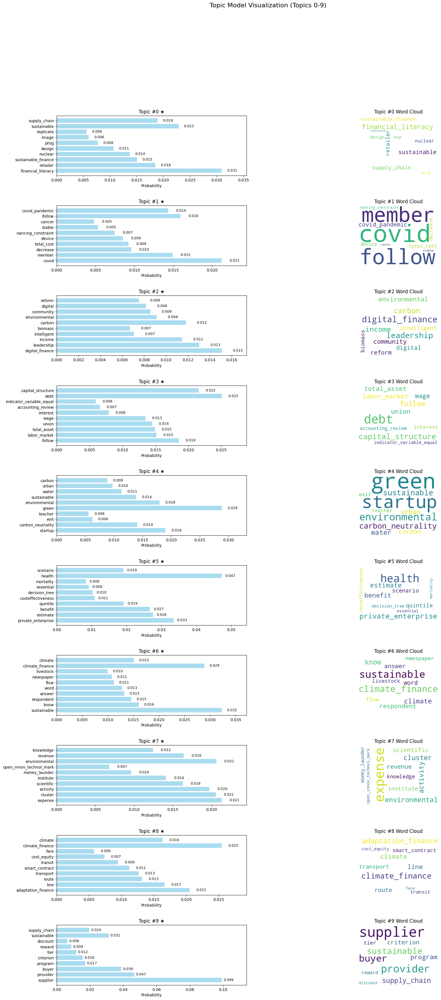

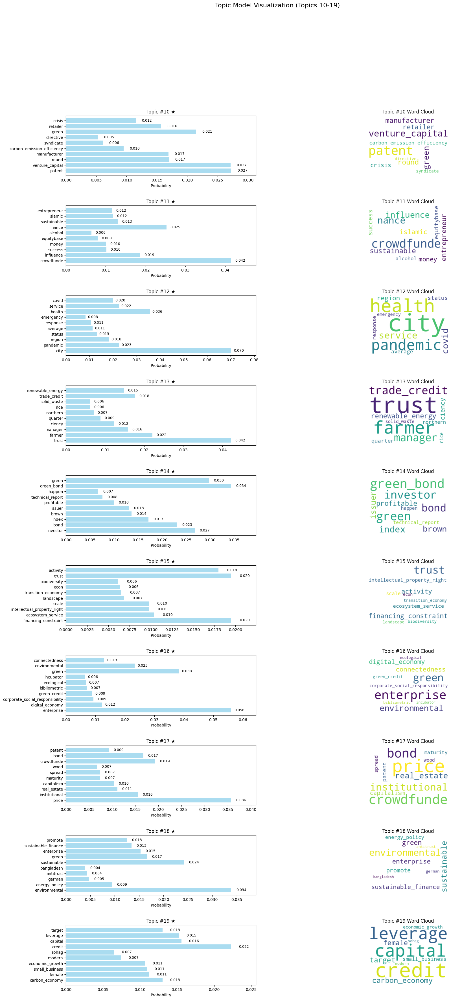

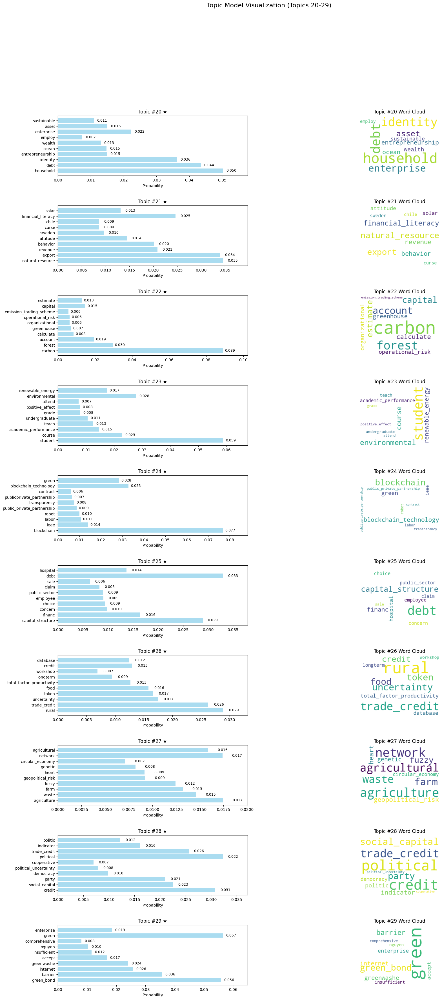

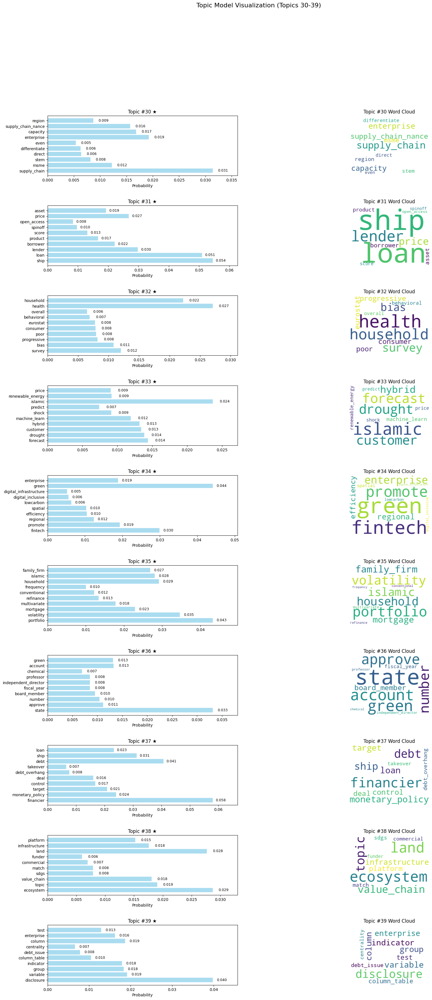

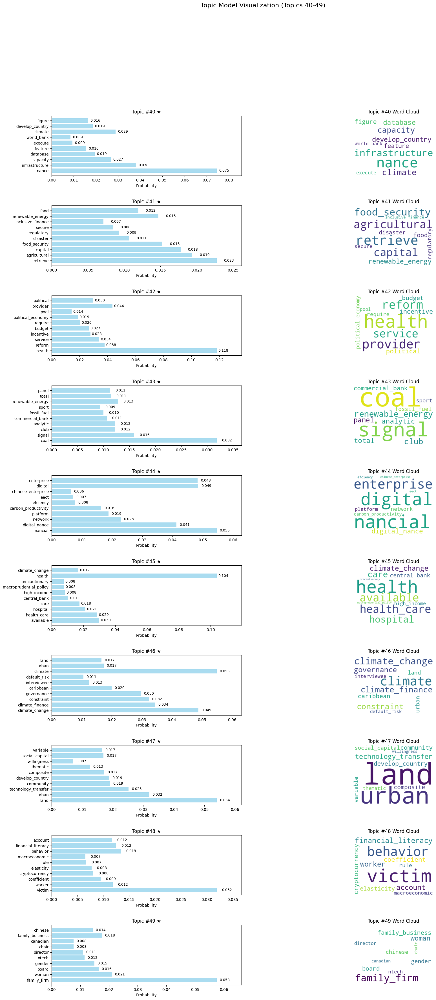

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def visualize_topics_enhanced(model, num_topics=50, topn=10, distinct_keywords=None):
    """
    Creates enhanced visualizations with option for distinct keywords
    """
    # Create a more manageable visualization for 50 topics
    # Instead of one giant plot, create multiple figures
    topics_per_figure = 10
    num_figures = (num_topics + topics_per_figure - 1) // topics_per_figure

    for fig_num in range(num_figures):
        start_topic = fig_num * topics_per_figure
        end_topic = min((fig_num + 1) * topics_per_figure, num_topics)
        current_topics = end_topic - start_topic

        fig, axes = plt.subplots(nrows=current_topics, ncols=2, figsize=(20, 4 * current_topics))
        if current_topics == 1:
            axes = axes.reshape(1, -1)

        plt.subplots_adjust(hspace=0.5, wspace=0.3)

        for idx, topic_id in enumerate(range(start_topic, end_topic)):
            # Get keywords - prefer distinct if available
            if distinct_keywords and distinct_keywords.get(topic_id):
                # Use distinct keywords with their probabilities
                distinct_set = set(distinct_keywords[topic_id])
                top_terms = []

                # Get probabilities for distinct keywords
                all_terms = model.show_topic(topic_id, topn=topn*3)
                for term, prob in all_terms:
                    if term in distinct_set:
                        top_terms.append((term, prob))
                    if len(top_terms) >= topn:
                        break

                # Fill with original terms if needed
                if len(top_terms) < topn:
                    for term, prob in all_terms:
                        if term not in distinct_set:
                            top_terms.append((term, prob))
                        if len(top_terms) >= topn:
                            break
            else:
                top_terms = model.show_topic(topic_id, topn=topn)

            if not top_terms:
                continue

            terms, probs = zip(*top_terms)

            # Create bar chart
            ax1 = axes[idx, 0]
            bars = ax1.barh(terms, probs, color='skyblue', alpha=0.7)

            # Add value labels on bars
            for bar, prob in zip(bars, probs):
                width = bar.get_width()
                ax1.text(width + 0.001, bar.get_y() + bar.get_height()/2,
                        f'{prob:.3f}', ha='left', va='center', fontsize=9)

            # Add distinct marker to title
            title = f'Topic #{topic_id}'
            if distinct_keywords and distinct_keywords.get(topic_id):
                title += " ★"  # Star indicator for distinct topics
            ax1.set_title(title, fontsize=12)
            ax1.set_xlabel('Probability', fontsize=10)
            ax1.set_xlim(0, max(probs) * 1.15)

            # Create word cloud
            ax2 = axes[idx, 1]
            word_freq = {term: prob for term, prob in top_terms}
            wordcloud = WordCloud(
                width=400, height=300,
                background_color='white',
                colormap='viridis',
                max_words=20
            ).generate_from_frequencies(word_freq)
            ax2.imshow(wordcloud, interpolation='bilinear')
            ax2.set_title(f'Topic #{topic_id} Word Cloud', fontsize=12)
            ax2.axis('off')

        plt.suptitle(f'Topic Model Visualization (Topics {start_topic}-{end_topic-1})',
                    fontsize=16, y=0.98)
        plt.savefig(f'topic_visualization_part_{fig_num+1}.png',
                   bbox_inches='tight', dpi=150)
        plt.show()

# Generate enhanced visualizations with distinct keywords
print("Generating enhanced topic visualizations...")
visualize_topics_enhanced(
    lda_model,
    num_topics=lda_model.num_topics,
    distinct_keywords=enhanced_distinct_topics
)

Creating document-topic matrix...


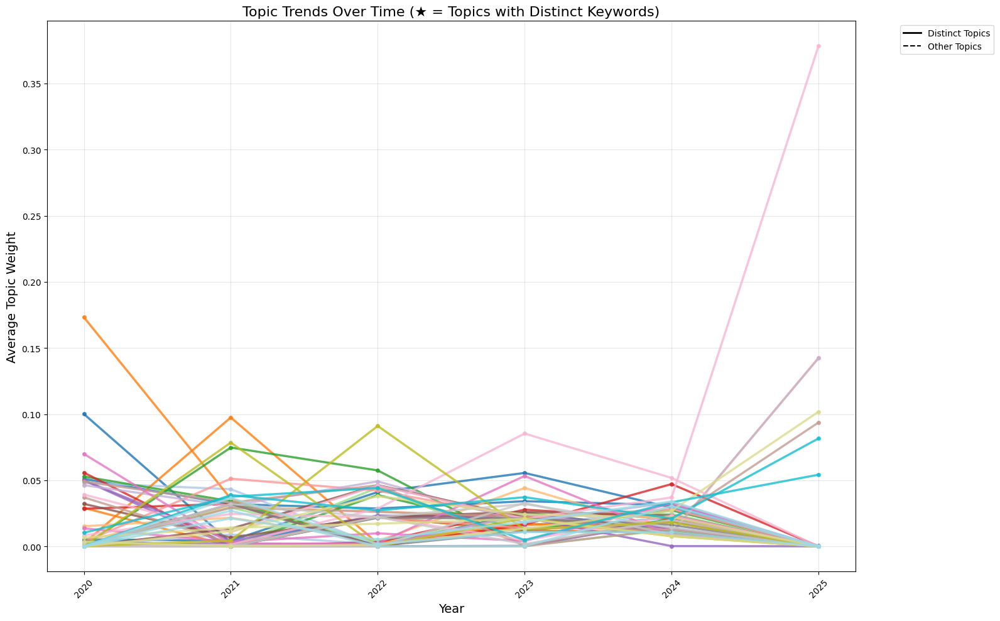


Trend Summary for Distinct Topics:
Topic 0 (financial_literacy, prog, nuclear): decreasing trend, peak in 2020
Topic 1 (total_cost, device, member): decreasing trend, peak in 2020
Topic 2 (leakage, leadership, digital_finance): decreasing trend, peak in 2023
Topic 3 (union, labor_market, total_asset): decreasing trend, peak in 2024
Topic 4 (carbon_neutrality, startup, seem): decreasing trend, peak in 2020
Topic 5 (private_enterprise, estimate, costeffectiveness): decreasing trend, peak in 2020
Topic 6 (newspaper, know, sustainable): decreasing trend, peak in 2020
Topic 7 (institute, expense, scientific): decreasing trend, peak in 2021
Topic 8 (transit, line, route): increasing trend, peak in 2025
Topic 9 (tier, supplier, buyer): decreasing trend, peak in 2023
Topic 10 (venture_capital, carbon_emission_efficiency, patent): decreasing trend, peak in 2022
Topic 11 (crowdfunde, equitybase, influence): decreasing trend, peak in 2021
Topic 12 (city, pandemic, region): decreasing trend, peak

In [ ]:
def plot_topic_trends_enhanced(model, doc_topic_matrix, years, distinct_keywords=None):
    """
    Enhanced temporal trends with distinct topic highlighting
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    import numpy as np

    num_topics = model.num_topics
    topic_cols = [f'Topic_{i}' for i in range(num_topics)]

    # Create DataFrame
    df = pd.DataFrame(doc_topic_matrix, columns=topic_cols)
    df['Year'] = years

    # Filter out unknown years and convert to int
    df = df[df['Year'] != "Unknown"]
    df['Year'] = df['Year'].astype(int)

    if df.empty:
        print("No valid years found for plotting")
        return

    # Group by year and calculate mean
    yearly_topic_means = df.groupby('Year')[topic_cols].mean()

    # Calculate which topics have distinct keywords
    has_distinct = set()
    if distinct_keywords:
        has_distinct = {topic_id for topic_id, keywords in distinct_keywords.items() if keywords}

    # Plot settings
    plt.figure(figsize=(16, 10))
    colors = plt.cm.tab20(np.linspace(0, 1, num_topics))

    # Plot each topic trend with enhanced styling
    for i in range(num_topics):
        line_style = '-' if i in has_distinct else '--'
        line_width = 2.5 if i in has_distinct else 1.5
        alpha = 0.8 if i in has_distinct else 0.5
        color = colors[i]

        # Get label with keywords if available
        if distinct_keywords and distinct_keywords.get(i):
            keywords = distinct_keywords[i][:2]  # Show first 2 keywords
            label = f'Topic {i}: {", ".join(keywords)}'
        else:
            label = f'Topic {i}'

        plt.plot(yearly_topic_means.index,
                 yearly_topic_means[f'Topic_{i}'],
                 label=label,
                 color=color,
                 linestyle=line_style,
                 linewidth=line_width,
                 alpha=alpha,
                 marker='o',
                 markersize=4)

    # Formatting
    plt.title('Topic Trends Over Time (★ = Topics with Distinct Keywords)', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Average Topic Weight', fontsize=14)

    # Create custom legend handles
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='black', lw=2, linestyle='-', label='Distinct Topics'),
        Line2D([0], [0], color='black', lw=1.5, linestyle='--', label='Other Topics')
    ]

    plt.legend(
        handles=legend_elements,
        bbox_to_anchor=(1.05, 1),
        loc='upper left',
        fontsize=10
    )

    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('enhanced_topic_trends.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Print summary of trends for distinct topics
    if distinct_keywords:
        print("\nTrend Summary for Distinct Topics:")
        for topic_id in sorted(has_distinct):
            trend_data = yearly_topic_means[f'Topic_{topic_id}']
            max_year = trend_data.idxmax()
            min_year = trend_data.idxmin()
            trend = "increasing" if trend_data.iloc[-1] > trend_data.iloc[0] else "decreasing"
            keywords = ", ".join(distinct_keywords[topic_id][:3])
            print(f"Topic {topic_id} ({keywords}): {trend} trend, peak in {max_year}")

# Create doc-topic matrix
print("Creating document-topic matrix...")
doc_topic_matrix = []
for doc in filtered_corpus:
    topic_dist = lda_model.get_document_topics(doc, minimum_probability=0)
    full_dist = [0.0] * lda_model.num_topics
    for topic_id, prob in topic_dist:
        full_dist[topic_id] = prob
    doc_topic_matrix.append(full_dist)

# Generate enhanced temporal visualization
plot_topic_trends_enhanced(lda_model, doc_topic_matrix, years, enhanced_distinct_topics)

In [ ]:
from collections import defaultdict

# Get distinct years from the dataset (skip "Unknown")
distinct_years = {int(year) for year in years if year and year != "Unknown"}
total_distinct_years = len(distinct_years)
min_year = min(distinct_years)
max_year = max(distinct_years)

print(f"Analyzing {total_distinct_years} years: {min_year} to {max_year}")

# Calculate topic-year matrix
topic_year_matrix = defaultdict(lambda: defaultdict(float))
doc_topic_matrix = [lda_model.get_document_topics(doc, minimum_probability=0) for doc in filtered_corpus]

for i, doc_topics in enumerate(doc_topic_matrix):
    year = years[i]
    if year and year != "Unknown":
        for topic_id, weight in doc_topics:
            topic_year_matrix[topic_id][year] += weight

# Normalize by document count per year
year_counts = defaultdict(int)
for year in years:
    if year and year != "Unknown":
        year_counts[year] += 1

for topic_id, yearly_weights in topic_year_matrix.items():
    for year, weight in yearly_weights.items():
        if year_counts[year] > 0:
            topic_year_matrix[topic_id][year] /= year_counts[year]

# Classify topics with enhanced criteria
topic_categories = {"Recurrent": [], "Emerging": [], "Seasonal": []}

for topic_id in range(lda_model.num_topics):
    presence = [
        int(year)
        for year, weight in topic_year_matrix[topic_id].items()
        if weight > 0.02  # Topic appears in at least 2% of documents
    ]
    num_years_present = len(presence)

    # Calculate presence ratio
    presence_ratio = num_years_present / total_distinct_years if total_distinct_years > 0 else 0

    # Enhanced classification logic
    if presence_ratio >= 0.6:  # Appears in 60%+ of years
        topic_categories["Recurrent"].append(topic_id)
    elif (max_year in presence and
          presence_ratio <= 0.3 and  # Mostly in recent years
          num_years_present <= 2):   # Limited historical presence
        topic_categories["Emerging"].append(topic_id)
    else:
        topic_categories["Seasonal"].append(topic_id)

# Enhanced printing with distinct keywords
print("\n" + "="*80)
print("TOPIC CLASSIFICATION WITH ENHANCED DISTINCT KEYWORDS")
print("="*80)

for category, topics in topic_categories.items():
    print(f"\n{category.upper()} CATEGORY ({len(topics)} topics):")
    print("-" * 50)

    for topic_id in sorted(topics):
        keywords = enhanced_distinct_topics.get(topic_id, [])

        if keywords:
            # Show presence pattern
            presence_years = sorted(topic_year_matrix[topic_id].keys())
            presence_str = f"Present in: {', '.join(map(str, presence_years))}"

            print(f"  Topic {topic_id}:")
            print(f"    Keywords: {', '.join(keywords)}")
            print(f"    {presence_str}")

            # Show trend if multiple years
            if len(presence_years) > 1:
                weights = [topic_year_matrix[topic_id][year] for year in presence_years]
                trend = "↑ increasing" if weights[-1] > weights[0] else "↓ decreasing"
                print(f"    Trend: {trend} ({weights[0]:.3f} → {weights[-1]:.3f})")
        else:
            standard_keywords = [word for word, _ in lda_model.show_topic(topic_id, topn=3)]
            print(f"  Topic {topic_id}: {', '.join(standard_keywords)} (No distinct keywords)")

Analyzing 6 years: 2020 to 2025

TOPIC CLASSIFICATION WITH ENHANCED DISTINCT KEYWORDS

RECURRENT CATEGORY (9 topics):
--------------------------------------------------
  Topic 1:
    Keywords: total_cost, device, member, covid, cancer, stable, decrease, nancing_constraint
    Present in: 2020, 2021, 2022, 2023, 2024, 2025
    Trend: ↓ decreasing (0.051 → 0.000)
  Topic 8:
    Keywords: transit, line, route, fare, adaptation_finance, cost_equity, transport, smart_contract
    Present in: 2020, 2021, 2022, 2023, 2024, 2025
    Trend: ↑ increasing (0.004 → 0.143)
  Topic 18:
    Keywords: environmental, antitrust, energy_policy, german, investment_behaviour, bangladesh, park
    Present in: 2020, 2021, 2022, 2023, 2024, 2025
    Trend: ↓ decreasing (0.003 → 0.000)
  Topic 24:
    Keywords: blockchain, ieee, robot, publicprivate_partnership, public_private_partnership, transparency, labor, contract
    Present in: 2020, 2021, 2022, 2023, 2024, 2025
    Trend: ↓ decreasing (0.046 → 0.000)


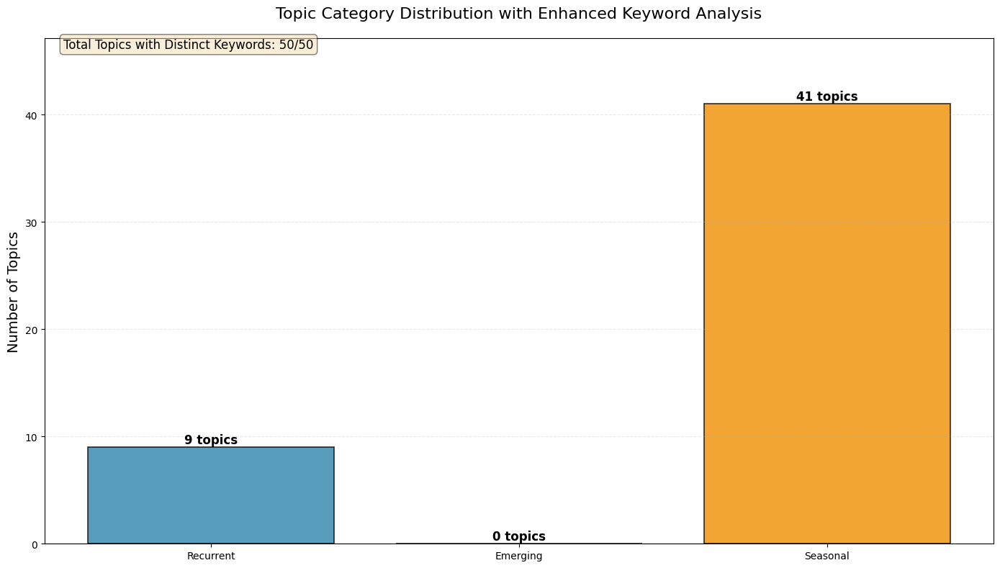


ENHANCED TOPIC KEYWORDS BY CATEGORY

RECURRENT TOPICS (9 total, 9 with distinct keywords):
  Topic 33 (strength: 0.089): hybrid, forecast, continue, customer, machine_learn, drought, predict, shock
  Topic 27 (strength: 0.040): geopolitical_risk, agriculture, waste, genetic, farm, heart, fuzzy, circular_economy
  Topic 8 (strength: 0.039): transit, line, route, fare, adaptation_finance, cost_equity, transport, smart_contract
  Topic 46 (strength: 0.034): national_level, caribbean, constraint, climate_change, interviewee, governance, climate_finance, default_risk
  Topic 45 (strength: 0.030): high_income, health_care, central_bank, available, precautionary, hospital, macroprudential_policy, care
  Topic 24 (strength: 0.030): blockchain, ieee, robot, publicprivate_partnership, public_private_partnership, transparency, labor, contract
  Topic 1 (strength: 0.030): total_cost, device, member, covid, cancer, stable, decrease, nancing_constraint
  Topic 18 (strength: 0.024): environmental, a

In [ ]:
# Enhanced category distribution plot
plt.figure(figsize=(14, 8))

# Prepare data for plotting
categories = list(topic_categories.keys())
counts = [len(topics) for topics in topic_categories.values()]
colors = ['#2E86AB', '#A23B72', '#F18F01']  # Better color scheme

# Create bar plot
bars = plt.bar(categories, counts, color=colors, alpha=0.8, edgecolor='black', linewidth=1.2)

# Add value labels on bars
for bar, count in zip(bars, counts):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{count} topics', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Calculate and display distinct keywords statistics
total_distinct = sum(1 for keywords in enhanced_distinct_topics.values() if keywords)
distinct_by_category = {category: 0 for category in categories}

for category, topics in topic_categories.items():
    for topic_id in topics:
        if enhanced_distinct_topics.get(topic_id):
            distinct_by_category[category] += 1

# Add distinct keywords info to plot
plt.text(0.02, 0.98, f'Total Topics with Distinct Keywords: {total_distinct}/{lda_model.num_topics}',
         transform=plt.gca().transAxes, fontsize=12, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.title('Topic Category Distribution with Enhanced Keyword Analysis', fontsize=16, pad=20)
plt.ylabel('Number of Topics', fontsize=14)
plt.ylim(0, max(counts) * 1.15)

# Add grid for better readability
plt.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('enhanced_topic_categories.png', dpi=300, bbox_inches='tight')
plt.show()

# Enhanced topic keywords by category
print("\n" + "="*80)
print("ENHANCED TOPIC KEYWORDS BY CATEGORY")
print("="*80)

for category, topics in topic_categories.items():
    distinct_count = distinct_by_category[category]
    total_count = len(topics)

    print(f"\n{category.upper()} TOPICS ({total_count} total, {distinct_count} with distinct keywords):")
    print('=' * 60)

    # Sort topics by presence strength
    topics_by_presence = sorted(topics,
        key=lambda x: sum(topic_year_matrix[x].values()),
        reverse=True)

    for topic_id in topics_by_presence:
        keywords = enhanced_distinct_topics.get(topic_id, [])

        if keywords:
            # Calculate topic strength (average presence across years)
            presence_values = list(topic_year_matrix[topic_id].values())
            avg_strength = sum(presence_values) / len(presence_values) if presence_values else 0

            print(f"  Topic {topic_id} (strength: {avg_strength:.3f}): {', '.join(keywords)}")
        else:
            standard_keywords = [word for word, _ in lda_model.show_topic(topic_id, topn=5)]
            print(f"  Topic {topic_id}: {', '.join(standard_keywords)}")

In [ ]:
# @title
from collections import defaultdict
import numpy as np

def get_distinct_topics(lda_model, id2word, min_exclusivity=0.8, topn=8):
    """
    Extract topics with distinct keywords that are primarily associated with one topic
    Parameters:
        min_exclusivity: Minimum ratio of word's probability in its primary topic vs other topics
        topn: Number of top keywords to return per topic
    Returns:
        Dictionary of distinct topics with their unique keywords
    """
    num_topics = lda_model.num_topics

    # Create word-topic matrix
    word_topic_matrix = defaultdict(dict)

    # Get all words and their topic distributions
    for topic_id in range(num_topics):
        for word, prob in lda_model.show_topic(topic_id, topn=None):
            word_topic_matrix[word][topic_id] = prob

    # Find distinct keywords for each topic
    distinct_topics = {}
    for topic_id in range(num_topics):
        topic_words = []

        for word, prob in lda_model.show_topic(topic_id, topn=topn*3):
            # Get all topic probabilities for this word
            topic_probs = word_topic_matrix[word]
            max_prob = max(topic_probs.values())
            primary_topic = max(topic_probs, key=topic_probs.get)

            # Check if this topic is the primary topic for the word
            if primary_topic != topic_id:
                continue

            # Calculate exclusivity ratio (prob in this topic vs next highest)
            sorted_probs = sorted(topic_probs.values(), reverse=True)
            if len(sorted_probs) > 1:
                exclusivity = sorted_probs[0] / sorted_probs[1]
            else:
                exclusivity = 10

            # Only include words that are highly exclusive to this topic
            if exclusivity >= min_exclusivity:
                topic_words.append((word, prob))


            if len(topic_words) >= topn:
                break

        # Sort by probability and store
        topic_words.sort(key=lambda x: x[1], reverse=True)
        distinct_topics[topic_id] = [word for word, prob in topic_words]

    return distinct_topics

# Get distinct topics
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# Print distinct topics
print("Topics with Distinct Keywords:")
for topic_id, keywords in distinct_topics.items():
    if keywords:
        print(f"Topic {topic_id}: {', '.join(keywords)}")

Topics with Distinct Keywords:
Topic 0: adaptation, tax, interviewee, limit, caribbean_sid, reit, thomas
Topic 1: hybrid, transfer, prediction, url, cluster_cluster, accuracy, individual
Topic 2: nancial, crossref, wine, value_chain, nancial_inclusion, farmer, startup
Topic 3: electrification, bangladesh, facility, minigrid, access_january
Topic 4: indonesia, nancing, household, progressivity, expense, shi, justice
Topic 5: trust, bus, organizational_resilience, transportation, readability, monetary, transport
Topic 6: bond, ship, loan, lender, borrower, score, stakeholder
Topic 7: sentiment, postipo, ipos, expert, initial, sovereign, decisionmake
Topic 8: income, people, healthcare, jkn, distribution, iabzew_startup, equation
Topic 9: ppp, private_partnership, transparency, ireland, access_june, option, ndfa
Topic 10: technol_forecast_soc_chang, spread, ndvi, capitaliq, maturity, yes_yes, renew
Topic 11: fintech, sme, earning_management, disclosure, protection, lending, bric
Topic 12:

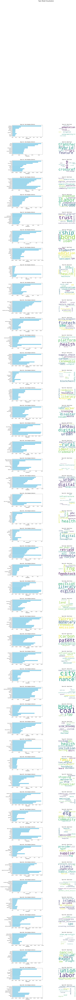

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def visualize_topics_enhanced(model, num_topics=50, topn=10, distinct_keywords=None):
    """
    Creates enhanced visualizations with option for distinct keywords
    """
    fig, axes = plt.subplots(nrows=num_topics, ncols=2, figsize=(20, 5*num_topics))
    plt.subplots_adjust(hspace=0.5, wspace=0.3)

    for topic_id in range(num_topics):

        if distinct_keywords and distinct_keywords.get(topic_id):
            # Get distinct keywords with their probabilities
            distinct_set = set(distinct_keywords[topic_id])
            top_terms = [(term, prob) for term, prob in model.show_topic(topic_id, topn=topn*2)
                         if term in distinct_set][:topn]

            # If we didn't get enough, fill with original terms
            if len(top_terms) < topn:
                original_terms = model.show_topic(topic_id, topn=topn)
                for term, prob in original_terms:
                    if term not in distinct_set and (term, prob) not in top_terms:
                        top_terms.append((term, prob))
                        if len(top_terms) >= topn:
                            break
        else:
            top_terms = model.show_topic(topic_id, topn=topn)

        terms, probs = zip(*top_terms)

        # Create bar chart
        ax1 = axes[topic_id, 0]
        ax1.barh(terms, probs, color='skyblue')

        # Add distinct marker to title
        title = f'Topic #{topic_id} - Term Weights'
        if distinct_keywords and distinct_keywords.get(topic_id):
            title += " (Distinct)"
        ax1.set_title(title, fontsize=14)
        ax1.set_xlabel('Probability', fontsize=12)
        ax1.invert_yaxis()

        # Create word cloud
        ax2 = axes[topic_id, 1]
        word_freq = {term: prob for term, prob in top_terms}
        wordcloud = WordCloud(width=600, height=400,
                             background_color='white').generate_from_frequencies(word_freq)
        ax2.imshow(wordcloud, interpolation='bilinear')
        ax2.set_title(f'Topic #{topic_id} - Word Cloud', fontsize=14)
        ax2.axis('off')

    plt.suptitle('Topic Model Visualization', fontsize=20, y=0.99)
    plt.savefig('topic_visualization.png', bbox_inches='tight')
    plt.show()

# Train LDA model
num_topics = 50
lda_model = LdaModel(
    corpus=filtered_corpus,
    id2word=id2word,
    num_topics=num_topics,
    random_state=100,
    passes=10,
    alpha='auto'
)

# Get distinct topics
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# Generate enhanced visualizations with distinct keywords
visualize_topics_enhanced(lda_model, num_topics=num_topics, distinct_keywords=distinct_topics)

# ... (pyLDAvis code remains unchanged) ...

In [ ]:
# ... (previous pyLDAvis import code) ...

def visualize_topics(model, corpus, id2word):
    """
    Generate interactive topic visualization using pyLDAvis
    """
    try:
        import pyLDAvis
        import pyLDAvis.gensim_models as gensimvis
    except ImportError:
        !pip install pyLDAvis==3.4.1
        import pyLDAvis
        import pyLDAvis.gensim_models as gensimvis

    try:
        vis = gensimvis.prepare(
            model,
            corpus,
            id2word,
            mds="mmds",
            R=30,
            sort_topics=False
        )
        return vis
    except Exception as e:
        print(f"Visualization error: {str(e)}")
        return None


# Get distinct topics
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)
print("="*80)
print("Discovered Topics:")
for topic_id in range(lda_model.num_topics):
    print(f"\nTopic #{topic_id}:")

    # Show original top terms
    top_terms = lda_model.show_topic(topic_id, topn=10)
    term_strings = [f"{term} ({prob:.3f})" for term, prob in top_terms]
    print("Standard Keywords: " + ", ".join(term_strings))

    # Show distinct keywords
    if distinct_topics[topic_id]:
        print(f"Distinct Keywords: {', '.join(distinct_topics[topic_id])}")
    else:
        print("Distinct Keywords: None")
print("="*80)

# Generate visualization
vis = visualize_topics(lda_model, filtered_corpus, id2word)

if vis:
    # Display in notebook
    pyLDAvis.display(vis)
    pyLDAvis.save_html(vis, 'topic_visualization.html')
    print("Visualization saved as 'topic_visualization.html'")
else:
    print("Failed to generate visualization")

Discovered Topics:

Topic #0:
Standard Keywords: adaptation (0.081), vulnerability (0.023), mitigation (0.018), doi (0.012), interview (0.009), allocation (0.009), interviewee (0.008), limit (0.008), caribbean_sid (0.008), capacity (0.008)
Distinct Keywords: adaptation, vulnerability, mitigation, allocation, interviewee, limit, caribbean_sid

Topic #1:
Standard Keywords: hybrid (0.022), transfer (0.019), feature (0.017), url (0.012), cluster_cluster (0.012), individual (0.009), customer (0.009), customer_loyalty (0.009), thematic (0.008), accuracy (0.008)
Distinct Keywords: hybrid, transfer, feature, url, cluster_cluster, individual, customer

Topic #2:
Standard Keywords: crossref (0.017), wine (0.016), loss_damage (0.012), reit (0.008), nance (0.007), real_estate (0.007), trade_credit (0.006), trust (0.006), optimal (0.006), adaptation (0.005)
Distinct Keywords: crossref, wine, loss_damage, reit, real_estate, optimal, proceed

Topic #3:
Standard Keywords: electrification (0.009), capi

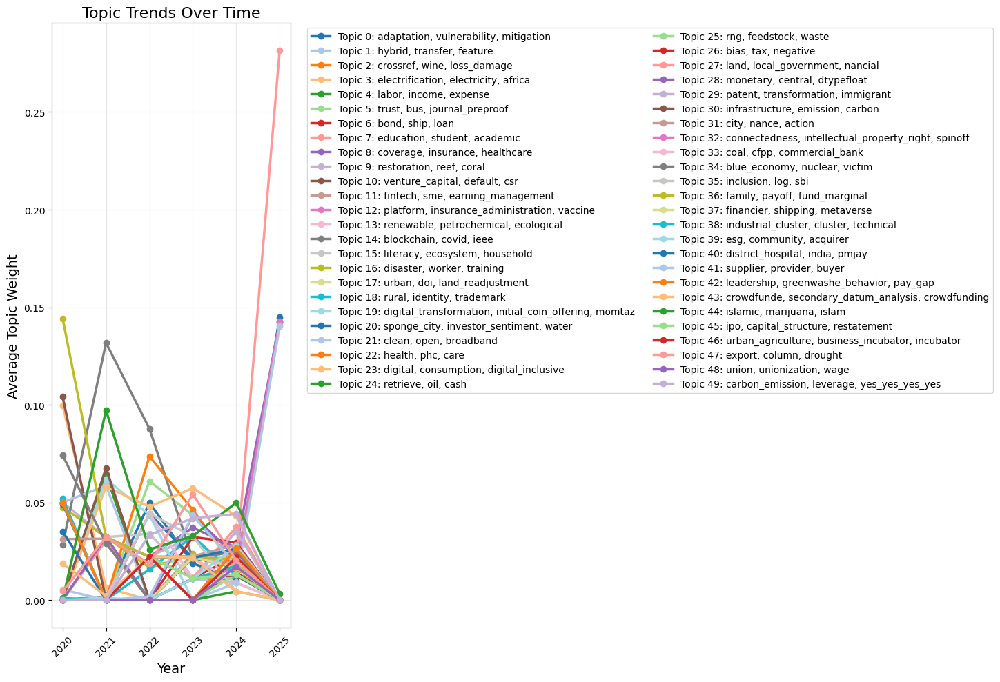

In [ ]:
def plot_topic_trends(model, doc_topic_matrix, years, distinct_topics=None):
    # Get actual number of topics from the model
    num_topics = model.num_topics

    # Create topic columns based on actual model topics
    topic_cols = [f'Topic_{i}' for i in range(num_topics)]

    # Create DataFrame
    df = pd.DataFrame(doc_topic_matrix, columns=topic_cols)
    df['Year'] = years

    # Filter out unknown years
    df = df[df['Year'] != "Unknown"]

    if df.empty:
        print("No valid years found for plotting")
        return

    # Group by year and calculate mean
    yearly_topic_means = df.groupby('Year')[topic_cols].mean()

    # Plot settings
    plt.figure(figsize=(15, 10))
    colors = plt.cm.tab20.colors

    # NEW: Prepare distinct topic labels
    topic_labels = {}
    for i in range(num_topics):
        if distinct_topics and distinct_topics.get(i):
            # Use distinct keywords if available
            topic_labels[i] = f"Topic {i}: {', '.join(distinct_topics[i][:3])}"
        else:
            # Fallback to standard label
            topic_labels[i] = f'Topic {i}'

    # Plot each topic trend
    for i in range(num_topics):
        plt.plot(yearly_topic_means.index,
                yearly_topic_means[f'Topic_{i}'],
                label=topic_labels[i],
                color=colors[i % 20],
                linewidth=2.5,
                marker='o')

    # Formatting
    plt.title('Topic Trends Over Time', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Average Topic Weight', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2)
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('topic_trends.png', bbox_inches='tight')
    plt.show()

# NEW: Get distinct topics for labeling
# Get distinct topics
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# Create doc-topic matrix
doc_topic_matrix = []
for doc in filtered_corpus:
    topic_dist = lda_model.get_document_topics(doc, minimum_probability=0)
    full_dist = [0.0] * lda_model.num_topics
    for topic_id, prob in topic_dist:
        full_dist[topic_id] = prob
    doc_topic_matrix.append(full_dist)

# Generate temporal visualization with distinct labels
plot_topic_trends(lda_model, doc_topic_matrix, years, distinct_topics=distinct_topics)

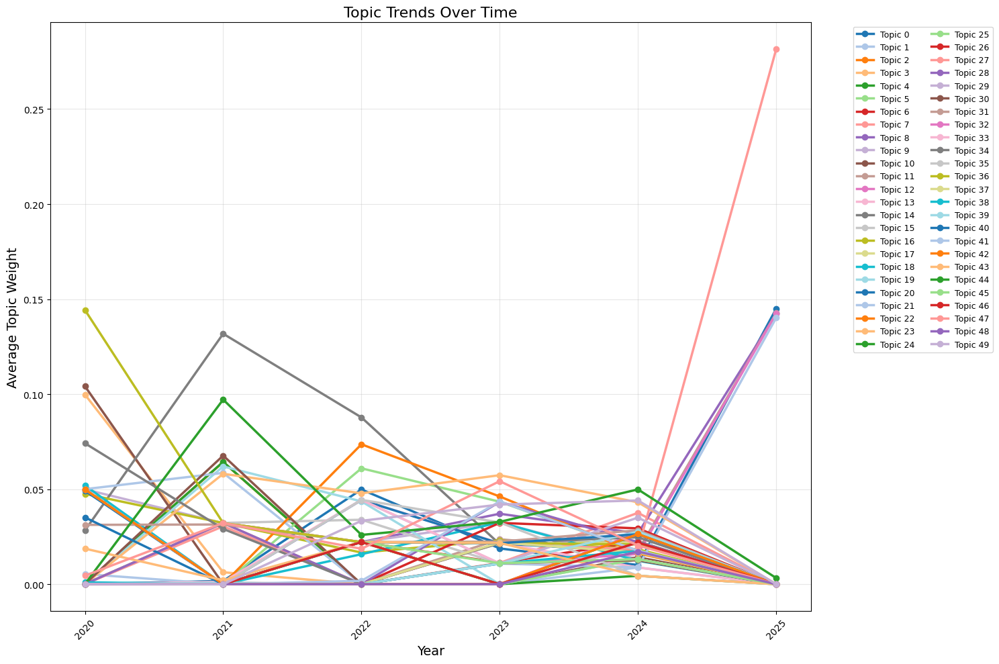

In [ ]:
def plot_topic_trends(model, doc_topic_matrix, years):
    import pandas as pd
    import matplotlib.pyplot as plt
    import numpy as np
    from matplotlib.cm import get_cmap

    num_topics = model.num_topics
    topic_cols = [f'Topic_{i}' for i in range(num_topics)]

    # Create DataFrame
    df = pd.DataFrame(doc_topic_matrix, columns=topic_cols)
    df['Year'] = years

    # Filter out unknown years
    df = df[df['Year'] != "Unknown"]
    df['Year'] = df['Year'].astype(int)

    if df.empty:
        print("No valid years found for plotting")
        return

    # Group by year and calculate mean
    yearly_topic_means = df.groupby('Year')[topic_cols].mean()

    # Plot settings
    plt.figure(figsize=(15, 10))
    tab20 = get_cmap('tab20')
    colors = [tab20(i % 20) for i in range(num_topics)]

    # Plot each topic trend
    for i in range(num_topics):
        plt.plot(yearly_topic_means.index,
                 yearly_topic_means[f'Topic_{i}'],
                 label=f'Topic {i}',
                 color=colors[i],
                 linewidth=2.5,
                 marker='o')

    # Formatting
    plt.title('Topic Trends Over Time', fontsize=16)
    plt.xlabel('Year', fontsize=14)
    plt.ylabel('Average Topic Weight', fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=2, fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('topic_trends.png', dpi=300, bbox_inches='tight')
    plt.show()

# Create doc-topic matrix
doc_topic_matrix = []
for doc in filtered_corpus:
    topic_dist = lda_model.get_document_topics(doc, minimum_probability=0)
    full_dist = [0.0] * lda_model.num_topics
    for topic_id, prob in topic_dist:
        full_dist[topic_id] = prob
    doc_topic_matrix.append(full_dist)

# Generate temporal visualization
plot_topic_trends(lda_model, doc_topic_matrix, years)

In [ ]:
# Get distinct years from the dataset (skip "Unknown")
distinct_years = {int(year) for year in years if year and year != "Unknown"}
total_distinct_years = len(distinct_years)
min_year = min(distinct_years)
max_year = max(distinct_years)

# Calculate topic-year matrix
topic_year_matrix = defaultdict(lambda: defaultdict(float))
doc_topic_matrix = [lda_model.get_document_topics(doc, minimum_probability=0) for doc in filtered_corpus]

for i, doc_topics in enumerate(doc_topic_matrix):
    year = years[i]
    if year and year != "Unknown":
        for topic_id, weight in doc_topics:
            topic_year_matrix[topic_id][year] += weight

# Normalize by document count per year
year_counts = defaultdict(int)
for year in years:
    if year and year != "Unknown":
        year_counts[year] += 1

for topic_id, yearly_weights in topic_year_matrix.items():
    for year, weight in yearly_weights.items():
        if year_counts[year] > 0:
            topic_year_matrix[topic_id][year] /= year_counts[year]

# NEW: Get distinct topics for classification
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# Classify topics
topic_categories = {"Recurrent": [], "Emerging": [], "Seasonal": []}
for topic_id in range(lda_model.num_topics):
    presence = [
        int(year)
        for year, weight in topic_year_matrix[topic_id].items()
        if weight > 0.02
    ]
    num_years_present = len(presence)

    # Classification logic
    if num_years_present >= total_distinct_years * 0.4:
        topic_categories["Recurrent"].append(topic_id)
    elif max_year in presence and min_year not in presence:
        topic_categories["Emerging"].append(topic_id)
    else:
        topic_categories["Seasonal"].append(topic_id)

# NEW: Print with distinct keywords
print("\nTopic Classification with Distinct Keywords:")
for category, topics in topic_categories.items():
    print(f"\n{category} ({len(topics)} topics):")
    for topic_id in topics:
        keywords = distinct_topics.get(topic_id, ["No distinct keywords"])
        print(f"  Topic {topic_id}: {', '.join(keywords)}")


Topic Classification with Distinct Keywords:

Recurrent (20 topics):
  Topic 6: bond, ship, loan, lender, liquidity, borrower, score
  Topic 8: coverage, insurance, healthcare, quintile, nigeria, pandemic, people
  Topic 9: restoration, reef, coral, reef_restoration, coral_reef, example, tourism
  Topic 14: blockchain, covid, ieee, covid_pandemic, httpsdoi_org, topic, inclusive
  Topic 16: disaster, worker, training, occupation, natural_disaster, eng, job
  Topic 17: urban, doi, land_readjustment, retailer, gamification, nancialization, razer
  Topic 20: sponge_city, investor_sentiment, water, intelligent, smart, debt_maturity, firmlevel
  Topic 21: clean, open, broadband, institute, scientific, supply, open_innov_technol_mark
  Topic 22: health, phc, care, payment, political, budget, reform
  Topic 23: digital, consumption, digital_inclusive, taoism, emergency, response, cover
  Topic 27: land, local_government, nancial, nancial_inclusion, province, rank, billionaire
  Topic 28: mone

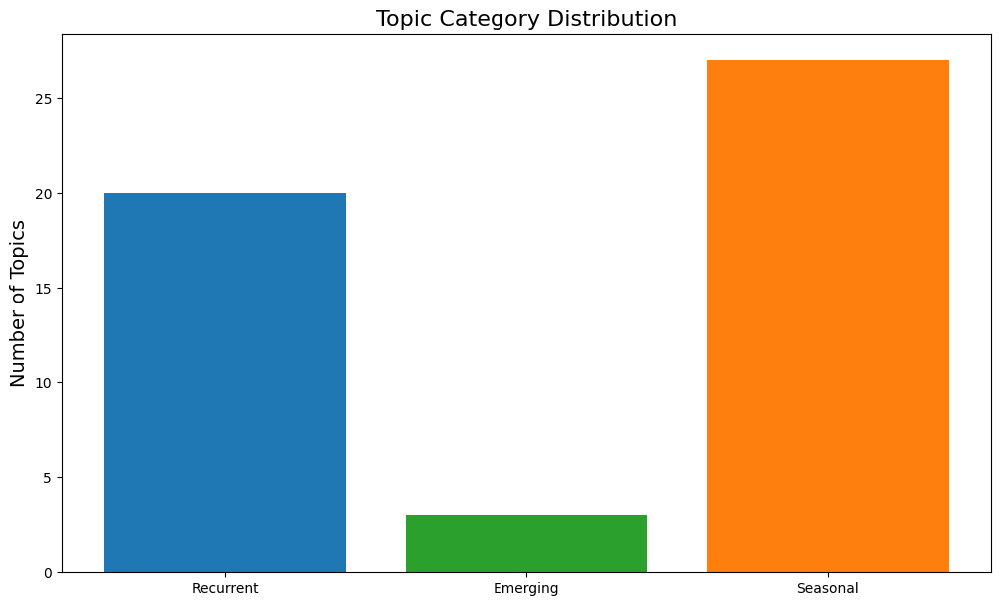


Topic Keywords by Category (Distinct Keywords Shown):

RECURRENT TOPICS (20):
Topic 6 (Distinct keywords): bond, ship, loan, lender, liquidity, borrower, score
Topic 8 (Distinct keywords): coverage, insurance, healthcare, quintile, nigeria, pandemic, people
Topic 9 (Distinct keywords): restoration, reef, coral, reef_restoration, coral_reef, example, tourism
Topic 14 (Distinct keywords): blockchain, covid, ieee, covid_pandemic, httpsdoi_org, topic, inclusive
Topic 16 (Distinct keywords): disaster, worker, training, occupation, natural_disaster, eng, job
Topic 17 (Distinct keywords): urban, doi, land_readjustment, retailer, gamification, nancialization, razer
Topic 20 (Distinct keywords): sponge_city, investor_sentiment, water, intelligent, smart, debt_maturity, firmlevel
Topic 21 (Distinct keywords): clean, open, broadband, institute, scientific, supply, open_innov_technol_mark
Topic 22 (Distinct keywords): health, phc, care, payment, political, budget, reform
Topic 23 (Distinct keywor

In [ ]:
# Get distinct topics for better keyword representation
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# Plot distribution
plt.figure(figsize=(12, 7))
plt.bar(topic_categories.keys(),
        [len(topics) for topics in topic_categories.values()],
        color=['#1f77b4', '#2ca02c', '#ff7f0e'])
plt.title("Topic Category Distribution", fontsize=16)
plt.ylabel("Number of Topics", fontsize=14)
plt.savefig('topic_categories.png', dpi=300, bbox_inches='tight')
plt.show()

# Print topic keywords with distinct focus
print("\nTopic Keywords by Category (Distinct Keywords Shown):")
for category, topics in topic_categories.items():
    print(f"\n{'='*60}")
    print(f"{category.upper()} TOPICS ({len(topics)}):")
    print('='*60)
    for topic_id in topics:
        # Use distinct keywords if available, otherwise top keywords
        if distinct_topics.get(topic_id):
            keywords = ", ".join(distinct_topics[topic_id])
            keyword_source = "Distinct"
        else:
            words = lda_model.show_topic(topic_id, topn=5)
            keywords = ", ".join([word for word, _ in words])
            keyword_source = "Standard"

        print(f"Topic {topic_id} ({keyword_source} keywords): {keywords}")

In [ ]:
!pip install flask-ngrok

Invalid -W option ignored: invalid action: 'ignore   # hides warnings at interpreter level'


In [ ]:
!pip install pyngrok
from pyngrok import ngrok

Invalid -W option ignored: invalid action: 'ignore   # hides warnings at interpreter level'


In [ ]:
# --- Imports ---
from flask import Flask, jsonify
from collections import defaultdict
from pyngrok import ngrok

# >>> Make sure these variables exist before running this cell:
# lda_model       # your trained gensim LDA model
# id2word         # gensim Dictionary used to train the model
# years           # list of years corresponding to each document
# filtered_corpus # your tokenized + dictionary.doc2bow corpus

# --- Add your ngrok auth token (only once per environment) ---
!ngrok config add-authtoken 33ICcq2LQEfoCshk7oekfZ5Wimu_3Kmob9hSobr9NzrUw9bQb

# --- Define get_distinct_topics (adapt to your logic) ---
def get_distinct_topics(model, id2word, min_exclusivity=0.85, topn=7):
    """
    Returns {topic_id: [keywords]} using topn=7 by default.
    Replace with your actual distinct-topic logic if needed.
    """
    topics = {}
    for topic_id in range(model.num_topics):
        words = [w for w, _ in model.show_topic(topic_id, topn)]
        topics[topic_id] = words
    return topics

# --- Initialize Flask ---
app = Flask(__name__)

# --- Kill any old ngrok tunnels and start a fresh one ---
ngrok.kill()
public_url = ngrok.connect(5000).public_url
print(f" * ngrok tunnel running at: {public_url}")
print(f" * Use endpoint: {public_url}/classify-topics")

# --- Get distinct topics globally ---
distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=7)

# --- Topic classification helper ---
def classify_topics(lda_model, years, filtered_corpus):
    distinct_years = {int(y) for y in years if y and y != "Unknown"}
    min_year, max_year = min(distinct_years), max(distinct_years)
    total_distinct_years = len(distinct_years)

    topic_year_matrix = defaultdict(lambda: defaultdict(float))
    doc_topic_matrix = [
        lda_model.get_document_topics(doc, minimum_probability=0)
        for doc in filtered_corpus
    ]

    for i, doc_topics in enumerate(doc_topic_matrix):
        y = years[i]
        if y and y != "Unknown":
            for t_id, weight in doc_topics:
                topic_year_matrix[t_id][y] += weight

    year_counts = defaultdict(int)
    for y in years:
        if y and y != "Unknown":
            year_counts[y] += 1

    for t_id, yearly_weights in topic_year_matrix.items():
        for y, weight in yearly_weights.items():
            if year_counts[y] > 0:
                topic_year_matrix[t_id][y] /= year_counts[y]

    categories = {"Recurrent": [], "Emerging": [], "Seasonal": []}
    for t_id in range(lda_model.num_topics):
        presence = [
            int(y) for y, w in topic_year_matrix[t_id].items() if w > 0.02
        ]
        if len(presence) >= total_distinct_years * 0.4:
            categories["Recurrent"].append(t_id)
        elif max_year in presence and min_year not in presence:
            categories["Emerging"].append(t_id)
        else:
            categories["Seasonal"].append(t_id)

    result = {}
    for cat, topics in categories.items():
        result[cat] = []
        for t_id in topics:
            # Use distinct keywords, else fallback to lda_model.show_topic
            if distinct_topics.get(t_id):
                kw = distinct_topics[t_id]
            else:
                kw = [w for w, _ in lda_model.show_topic(t_id, topn=7)]
            result[cat].append({
                "topic_id": t_id,
                "keywords": kw
            })
    return result

# --- API endpoint ---
@app.route("/classify-topics", methods=["GET"])
def classify_endpoint():
    return jsonify(classify_topics(lda_model, years, filtered_corpus))

# --- Run Flask server (keep this cell running) ---
if __name__ == "__main__":
    app.run()


Invalid -W option ignored: invalid action: 'ignore   # hides warnings at interpreter level'
Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
 * ngrok tunnel running at: https://overwidely-unexhibitable-lee.ngrok-free.dev
 * Use endpoint: https://overwidely-unexhibitable-lee.ngrok-free.dev/classify-topics
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:20:53] "GET /classify-topics HTTP/1.1" 200 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:02] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:02] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:02] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:16] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:16] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:19] "OPTIONS /classify-topics/classify-topics HTTP/1.1" 404 -
INFO:werkzeug:127.0.0.1 - - [30/Sep/2025 11:24:19] "O

In [ ]:
# --- Imports ---
from flask import Flask, jsonify
from collections import defaultdict
from pyngrok import ngrok

# >>> Make sure these variables exist before running this cell:
# lda_model       # your trained gensim LDA model
# id2word         # gensim Dictionary used to train the model
# years           # list of years corresponding to each document
# filtered_corpus # your tokenized + dictionary.doc2bow corpus

# --- Add your ngrok auth token (only once per environment) ---
!ngrok config add-authtoken 33ICcq2LQEfoCshk7oekfZ5Wimu_3Kmob9hSobr9NzrUw9bQb  # replace with your token

# --- Define get_distinct_topics (must match how you created it earlier) ---
def get_distinct_topics(model, id2word, min_exclusivity=0.85, topn=5):
    """
    Example implementation: adapt to your actual logic.
    Returns {topic_id: [keywords]}.
    """
    topics = {}
    for topic_id in range(model.num_topics):
        words = [w for w, p in model.show_topic(topic_id, topn)]
        topics[topic_id] = words
    return topics

# --- Initialize Flask ---
app = Flask(__name__)

# --- Kill any old tunnels and start a fresh one ---
ngrok.kill()
public_url = ngrok.connect(5000).public_url
print(f" * ngrok tunnel running at: {public_url}")
print(f" * Use endpoint: {public_url}/classify-topics")

# --- Topic classification helper ---
def classify_topics(lda_model, years, filtered_corpus):
    distinct_years = {int(y) for y in years if y and y != "Unknown"}
    min_year, max_year = min(distinct_years), max(distinct_years)
    total_distinct_years = len(distinct_years)

    topic_year_matrix = defaultdict(lambda: defaultdict(float))
    doc_topic_matrix = [
        lda_model.get_document_topics(doc, minimum_probability=0)
        for doc in filtered_corpus
    ]

    for i, doc_topics in enumerate(doc_topic_matrix):
        y = years[i]
        if y and y != "Unknown":
            for t_id, weight in doc_topics:
                topic_year_matrix[t_id][y] += weight

    year_counts = defaultdict(int)
    for y in years:
        if y and y != "Unknown":
            year_counts[y] += 1

    for t_id, yearly_weights in topic_year_matrix.items():
        for y, weight in yearly_weights.items():
            if year_counts[y] > 0:
                topic_year_matrix[t_id][y] /= year_counts[y]

    # ✅ Pass id2word here
    distinct_topics = get_distinct_topics(lda_model, id2word, min_exclusivity=0.85, topn=5)

    categories = {"Recurrent": [], "Emerging": [], "Seasonal": []}
    for t_id in range(lda_model.num_topics):
        presence = [
            int(y) for y, w in topic_year_matrix[t_id].items() if w > 0.02
        ]
        if len(presence) >= total_distinct_years * 0.4:
            categories["Recurrent"].append(t_id)
        elif max_year in presence and min_year not in presence:
            categories["Emerging"].append(t_id)
        else:
            categories["Seasonal"].append(t_id)

    result = {}
    for cat, topics in categories.items():
        result[cat] = [
            {"topic_id": t, "keywords": distinct_topics.get(t, ["No keywords"])}
            for t in topics
        ]
    return result

# --- API endpoint ---
@app.route("/classify-topics", methods=["GET"])
def classify_endpoint():
    return jsonify(classify_topics(lda_model, years, filtered_corpus))

# --- Run the Flask server (keep this cell running) ---
if __name__ == "__main__":
    app.run()


Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
 * ngrok tunnel running at: https://overwidely-unexhibitable-lee.ngrok-free.dev
 * Use endpoint: https://overwidely-unexhibitable-lee.ngrok-free.dev/classify-topics
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
ERROR:__main__:Exception on /classify-topics [GET]
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 1511, in wsgi_app
    response = self.full_dispatch_request()
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 919, in full_dispatch_request
    rv = self.handle_user_exception(e)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 917, in full_dispatch_request
    rv = self.dispatch_request()
         ^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 902, in dispatch_request
    return self.ensure_sync(self.view_functions[rule.endpoint])(**view_args)  # type: ignore[no-any-ret

In [ ]:
from flask import Flask, jsonify
# from flask_ngrok import run_with_ngrok # Remove flask-ngrok
from collections import defaultdict
from pyngrok import ngrok # Import pyngrok

!ngrok config add-authtoken 33ICcq2LQEfoCshk7oekfZ5Wimu_3Kmob9hSobr9NzrUw9bQb

# Initialize Flask
app = Flask(__name__)
# run_with_ngrok(app)  # Remove flask-ngrok run

# Start ngrok tunnel
# You can get a free authtoken from https://ngrok.com/signup
# Then run `ngrok config add-authtoken <YOUR_AUTHTOKEN>` in your terminal or add it here
# ngrok.set_auth_token("YOUR_AUTHTOKEN") # Optional: add your authtoken here if not configured
try:
    # Kill any running ngrok tunnels
    ngrok.kill()
    # Start a new tunnel
    public_url = ngrok.connect(5000).public_url
    print(f" * ngrok tunnel running at: {public_url}")
except Exception as e:
    print(f"Error starting ngrok tunnel: {e}")
    public_url = None


# ---- Your Topic Classification Function ----
def classify_topics(lda_model, years, filtered_corpus):
    # Get distinct years
    distinct_years = {int(year) for year in years if year and year != "Unknown"}
    total_distinct_years = len(distinct_years)
    min_year = min(distinct_years)
    max_year = max(distinct_years)

    # Topic-year matrix
    topic_year_matrix = defaultdict(lambda: defaultdict(float))
    doc_topic_matrix = [
        lda_model.get_document_topics(doc, minimum_probability=0)
        for doc in filtered_corpus
    ]

    for i, doc_topics in enumerate(doc_topic_matrix):
        year = years[i]
        if year and year != "Unknown":
            for topic_id, weight in doc_topics:
                topic_year_matrix[topic_id][year] += weight

    # Normalize by doc count
    year_counts = defaultdict(int)
    for year in years:
        if year and year != "Unknown":
            year_counts[year] += 1

    for topic_id, yearly_weights in topic_year_matrix.items():
        for year, weight in yearly_weights.items():
            if year_counts[year] > 0:
                topic_year_matrix[topic_id][year] /= year_counts[year]

    # Distinct keywords
    # Ensure get_distinct_topics is defined or imported if not in the same cell
    # from your_module import get_distinct_topics # Uncomment and adjust if needed
    distinct_topics = get_distinct_topics(lda_model, min_exclusivity=0.85, topn=5)


    # Classification
    topic_categories = {"Recurrent": [], "Emerging": [], "Seasonal": []}
    for topic_id in range(lda_model.num_topics):
        # Ensure years are treated as numbers for comparison
        presence = [
            int(year)
            for year, weight in topic_year_matrix[topic_id].items()
            if weight > 0.02
        ]
        num_years_present = len(presence)

        # Classification criteria - adjust as needed
        # Recurrent: present in a significant percentage of years
        is_recurrent = num_years_present >= total_distinct_years * 0.4

        # Emerging: present in recent years but not early years
        is_emerging = max_year in presence and min_year not in presence

        # Seasonal: present sporadically
        # If not recurrent and not emerging, classify as seasonal
        if is_recurrent:
            topic_categories["Recurrent"].append(topic_id)
        elif is_emerging:
            topic_categories["Emerging"].append(topic_id)
        else:
            topic_categories["Seasonal"].append(topic_id)


    # Prepare result with keywords
    result = {}
    for category, topics in topic_categories.items():
        result[category] = []
        for topic_id in topics:
            keywords = distinct_topics.get(topic_id, ["No distinct keywords"])
            result[category].append({
                "topic_id": topic_id,
                "keywords": keywords
            })

    return result


# ---- API Endpoint ----
@app.route("/classify-topics", methods=["GET"])
def classify_endpoint():
    # Use the existing lda_model, years, filtered_corpus variables
    result = classify_topics(lda_model, years, filtered_corpus)
    return jsonify(result)


# ---- Run the app ----
if __name__ == "__main__":
    # Run Flask app
    app.run()

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
 * ngrok tunnel running at: https://overwidely-unexhibitable-lee.ngrok-free.dev
 * Serving Flask app '__main__'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on http://127.0.0.1:5000
INFO:werkzeug:Press CTRL+C to quit
ERROR:__main__:Exception on /classify-topics [GET]
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 1511, in wsgi_app
    response = self.full_dispatch_request()
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 919, in full_dispatch_request
    rv = self.handle_user_exception(e)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 917, in full_dispatch_request
    rv = self.dispatch_request()
         ^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flask/app.py", line 902, in dispatch_request
    return self.ensure_sync(self.view_functions[rule.endpoint])(**view_args)  # type: ignore[no-any-ret